# Processing the new QC file we created from the raw Single Cell data in to clusters

## Imports

In [1]:
import numpy as np
import scanpy as sc
import os
import pandas as pd
#import bbknn

## Single Cell settings

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(80) 
sc.settings.file_format_figures = 'png'
sc.settings.savefigs = False
use_first_n_samples = 0
full_sparse = False

C:\Users\TzachiHNB12\AppData\Local\Temp\ipykernel_3208\738880785.py:2: FutureWarning: The specified parameters ('scanpy',) are no longer positional. Please specify them like `scanpy=80`
  sc.settings.set_figure_params(80)


## Defining a function for processing the data & determing the parameters

In [3]:
def processing_batch(adata, neighbors=15, key='batch', reso=0.4):  # Higher resolution yields more leiden clusters 
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack', random_state=8)
    sc.logging.print_memory_usage()
    sc.pp.neighbors(adata, n_neighbors=neighbors, random_state=8)
    sc.pl.pca_variance_ratio(adata, log=True)
    bbknn.bbknn(adata, batch_key=key, neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
    sc.tl.umap(adata, random_state=8)
    sc.tl.leiden(adata, resolution=reso, random_state=8)
    sc.pl.umap(adata, color='leiden')

## Reading the excisting h5ad file created previously in the QC pipeline 

In [4]:
#adata after QC
adata = sc.read(r'/Code/data/single_cell/animals/frog/new_mapping_11_2024/frog_2_and_3/''frog_2_3_after_cca_names_ncbi.h5ad') 

sc.read_h5ad(r'/Code/data/single_cell/animals/frog/new_mapping_11_2024/frog_2_and_3/''frog_2_3_after_cca_names_ncbi.h5ad')

# If the anndata object is processed and contains the raw data in adata.raw run -  adata = adata.raw.to_adata()

AnnData object with n_obs × n_vars = 56563 × 42755
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'sample', 'cca_clusters', 'seurat_clusters', 'ident'
    var: 'gene_id', 'gene_ids'
    uns: 'X_name'
    obsm: 'INTEGRATED.CCA', 'PCA', 'UMAP.CCA.CCA'
    layers: 'logcounts'

## Processing the data 

In [5]:
adata

AnnData object with n_obs × n_vars = 56563 × 42755
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'sample', 'cca_clusters', 'seurat_clusters', 'ident'
    var: 'gene_id', 'gene_ids'
    uns: 'X_name'
    obsm: 'INTEGRATED.CCA', 'PCA', 'UMAP.CCA.CCA'
    layers: 'logcounts'

In [6]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,sample,cca_clusters,seurat_clusters,ident
Frog2_AAACCCAAGCAGCCCT-1-UNST,MyProject,686.0,408,UNST,408,408,686.0,55.0,8.017493,Frog2,2,2,2
Frog2_AAACCCAAGCATAGGC-1-UNST,MyProject,3807.0,1555,UNST,1555,1555,3807.0,21.0,0.551615,Frog2,1,1,1
Frog2_AAACCCAAGCCATCCG-1-UNST,MyProject,3156.0,1308,UNST,1308,1308,3156.0,33.0,1.045627,Frog2,0,0,0
Frog2_AAACCCAAGCGTATGG-1-UNST,MyProject,1339.0,622,UNST,622,622,1339.0,105.0,7.841673,Frog2,2,2,2
Frog2_AAACCCAAGGCGCTTC-1-UNST,MyProject,2919.0,1248,UNST,1248,1248,2919.0,64.0,2.192532,Frog2,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Frog3_TTTGGTTGTAGACAAT-1-PIC,MyProject,2563.0,1356,PIC,1356,1356,2563.0,21.0,0.819352,Frog3,0,0,0
Frog3_TTTGGTTGTTTGGGAG-1-PIC,MyProject,2522.0,1206,PIC,1206,1206,2522.0,18.0,0.713719,Frog3,1,1,1
Frog3_TTTGGTTTCGCTGTTC-1-PIC,MyProject,3187.0,1625,PIC,1625,1625,3187.0,43.0,1.349231,Frog3,1,1,1
Frog3_TTTGGTTTCTGATTCT-1-PIC,MyProject,2476.0,1211,PIC,1211,1211,2476.0,36.0,1.453958,Frog3,3,3,3


In [7]:
adata.var

,gene_id,gene_ids
PEPA_1,LOC108704873,LOC108704873
PI16,LOC108704861,LOC108704861
DOK1,dok1.L,dok1.L
RT26,mrps26.L,mrps26.L
M1AP,LOC108704862,LOC108704862
...,...,...
MT.ND6,MT.ND6,MT.ND6
unassigned-gene-22,unassigned-gene-22,unassigned-gene-22
MT.CYTB,MT.CYTB,MT.CYTB
unassigned-gene-23,unassigned-gene-23,unassigned-gene-23


### Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [ 7491 17502 34224] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


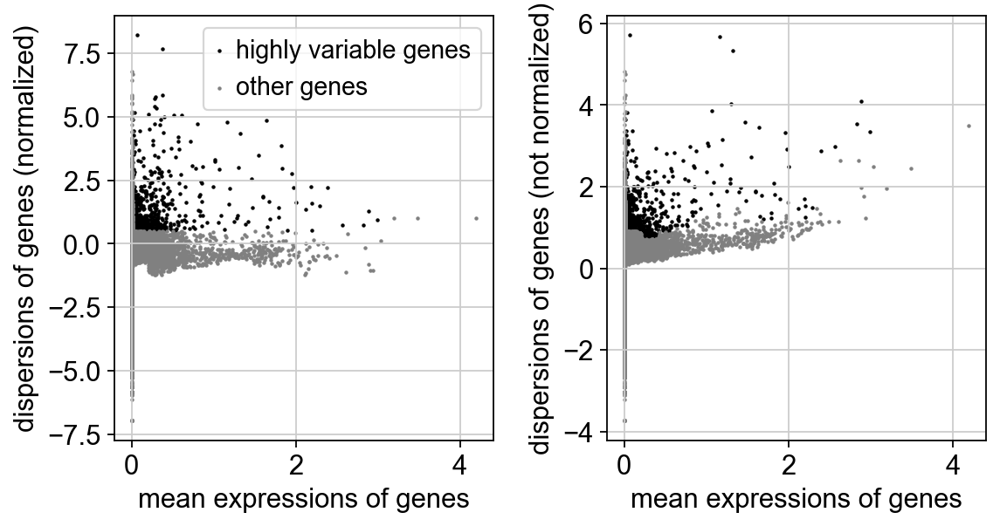

In [8]:
# Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations.

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata
# adata = adata[:, adata.var.highly_variable] # For filtering non Highly variable genes. We usually keep all the genes. 

In [9]:
sc.pp.regress_out(adata, ['total_counts','pct_counts_MT'])

# Got it from: https://github.com/theislab/single-cell-tutorial/issues/35
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata) 

regressing out ['total_counts', 'pct_counts_MT']
    sparse input is densified and may lead to high memory use
    finished (0:39:06)
    ... clipping at max_value 10
computing PCA


c:\Python\Python312\Lib\site-packages\scanpy\preprocessing\_pca.py:377: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    with n_comps=50
    finished (0:00:16)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:01:08)
    computed connectivities (0:00:05)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:14)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:01:23)


    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:20)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
Memory usage: current 20.00 GB, difference +20.00 GB
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:22)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)


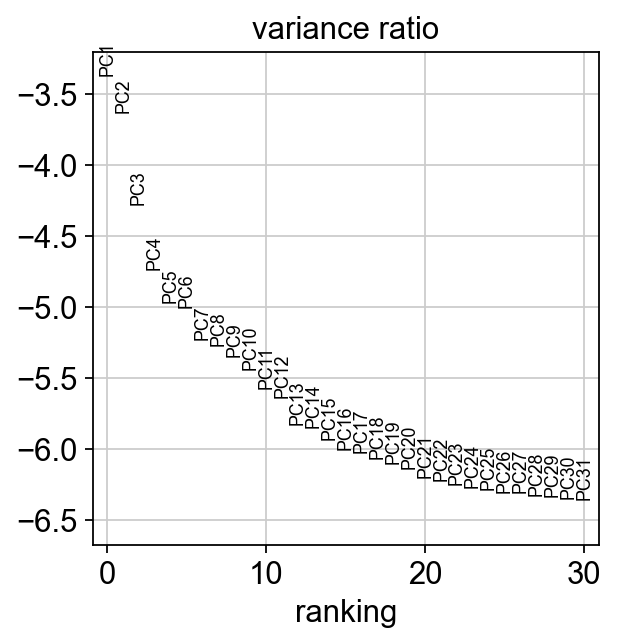

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:15)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:01:11)
running Leiden clustering


C:\Users\TzachiHNB12\AppData\Local\Temp\ipykernel_3208\1898756374.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=reso, random_state=8)


    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:21)


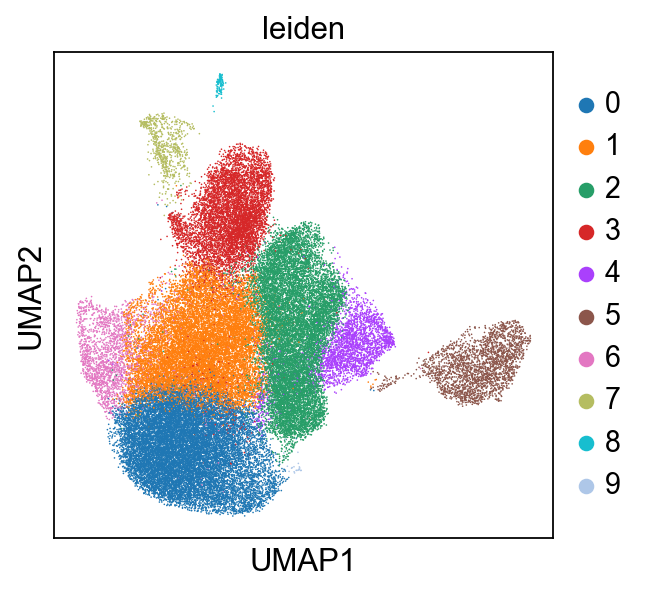

In [10]:
import bbknn
processing_batch(adata, key='treatment')

### Ranking genes ( = top 20)

ranking genes
    consider 'treatment' groups:
    with sizes: [11419 15905 11788 17451]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:05:53)


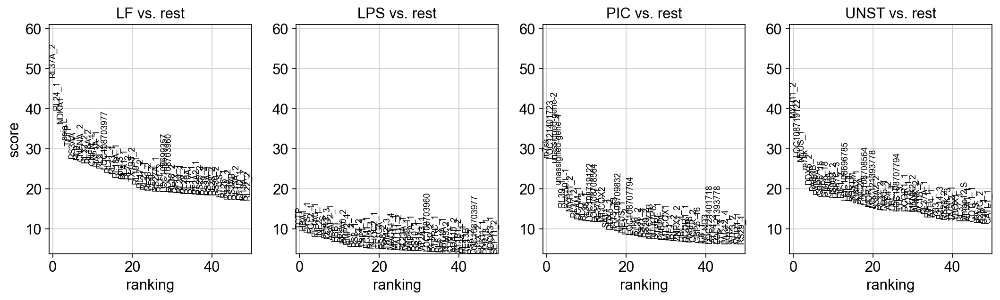

,LF,LPS,PIC,UNST
0,RL37A_2,TCTP,rn7sk,MYH11_2
1,RL24_1,HBA1,LOC121401723,LOC108719122
2,NDKA1,DYST_1,unassigned-gene-2,NEUS_1
3,ppia.L,FGL2_1,unassigned-gene-4,rn7sk
4,TCTP,EF1A0_1,RL39_1,DDX5_2
5,RS3AA,INF2_1,ccdc50.L-1,PABPB
6,RL9_1,ppia.S,MYH11_2,PABPA
7,CNFNA_2,CCN3_3,RL37_2,GBP6_16
8,RL32_2,ASAP2_1,DCAM_1,GBP6_18
9,RL18A_2,HBB1,RL37_1,CIRBA


In [11]:
sc.tl.rank_genes_groups(adata, groupby='treatment', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=True)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

# sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color = ['PLAC8', 'CD83', 'CD74', 'CD79B', 'CD38', 'IL10', 'CD7'], size=50)

In [12]:
adata.obs['treatment'].value_counts()

treatment
UNST    17451
LPS     15905
PIC     11788
LF      11419
Name: count, dtype: int64

### UMAP's

#### T cells

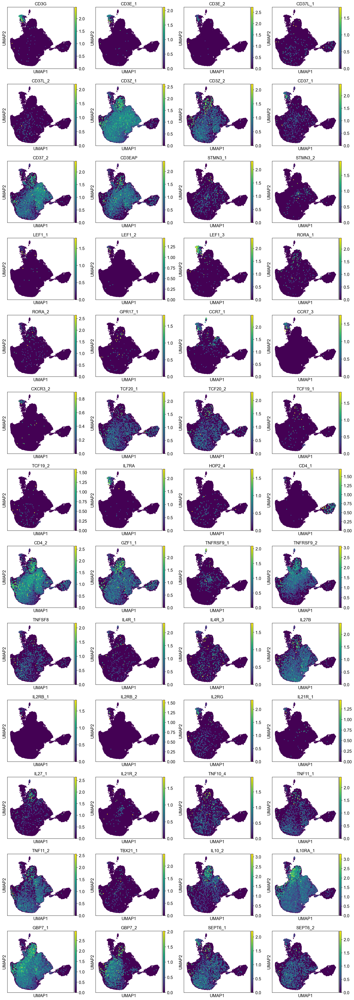

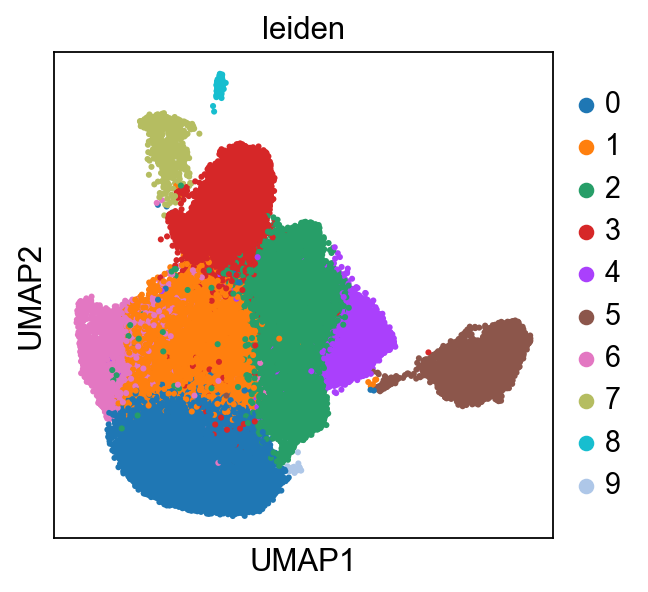

In [27]:
# T cells. 'CCR7' is a marker for T cells and also B cells. Markers from Roy's Extended_Data_Figures.
# Markers for T cells https://www.beckman.com/resources/cell-types/blood-cells/leukocytes/lymphocytes/t-cells
sc.pl.umap(adata, color=['CD3G','CD3E_1','CD3E_2','CD37L_1','CD37L_2','CD3Z_1','CD3Z_2',
                         'CD37_1','CD37_2','CD3EAP','STMN3_1','STMN3_2','LEF1_1','LEF1_2',
                         'LEF1_3','RORA_1','RORA_2','GPR17_1','CCR7_1','CCR7_3','CXCR3_2',
                         'TCF20_1','TCF20_2','TCF19_1','TCF19_2','IL7RA','HOP2_4','CD4_1',
                         'CD4_2','GZF1_1','TNFRSF9_1','TNFRSF9_2','TNFSF8','IL4R_1','IL4R_3',
                         'IL27B','IL2RB_1','IL2RB_2','IL2RG','IL21R_1','IL27_1','IL21R_2',
                         'TNF10_4','TNF11_1','TNF11_2','TBX21_1','IL10_2','IL10RA_1','GBP7_1',
                         'GBP7_2','SEPT6_1','SEPT6_2'], size=30)

sc.pl.umap(adata, color='leiden', size=30)

#### B cells

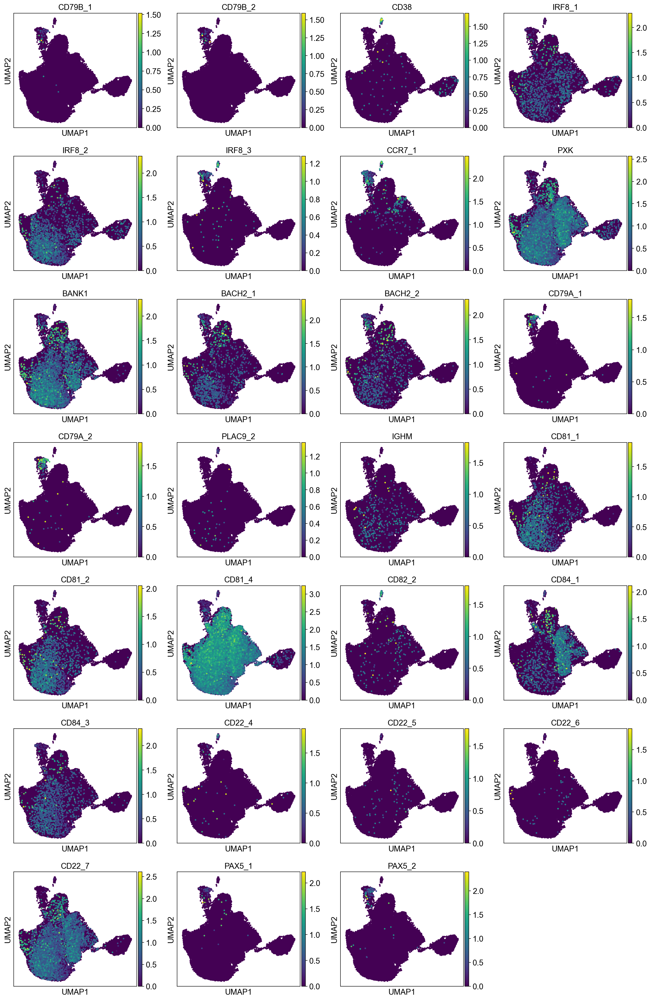

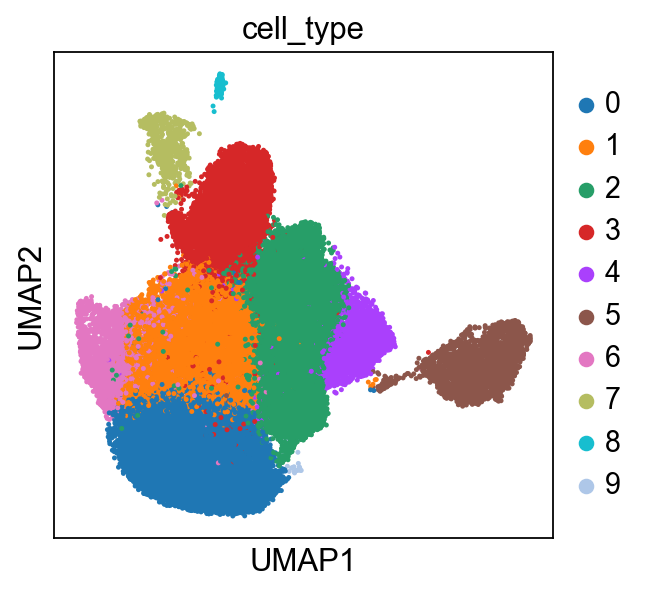

In [32]:
# B cells markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['CD79B_1','CD79B_2','CD38','IRF8_1','IRF8_2','IRF8_3',
                         'CCR7_1','PXK','BANK1','BACH2_1','BACH2_2','CD79A_1',
                         'CD79A_2','PLAC9_2','IGHM','CD81_1','CD81_2','CD81_4',
                         'CD82_2','CD84_1','CD84_3','CD22_4','CD22_5','CD22_6',
                         'CD22_7','PAX5_1','PAX5_2'], size=30)

celltype = {'0':'0','1':'1','2':'2','3':'3','4':'4','5':'5','6':'6','7':'7','8':'8','9':'9'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### RBC

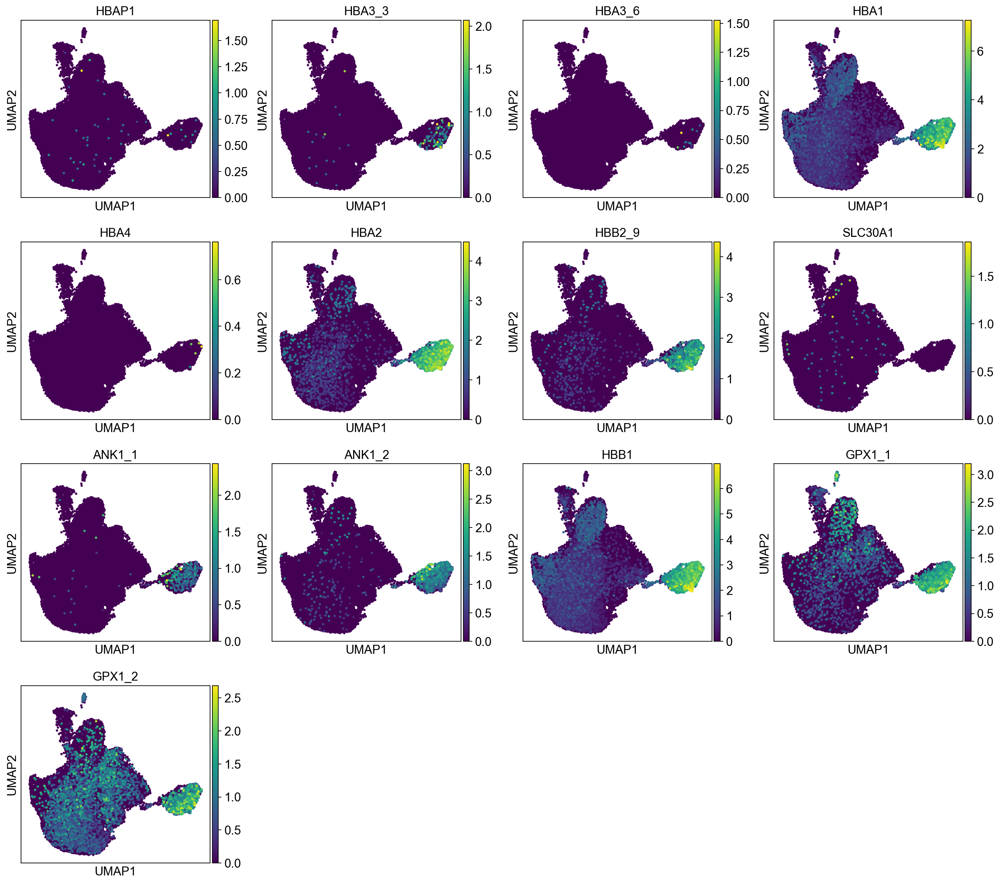

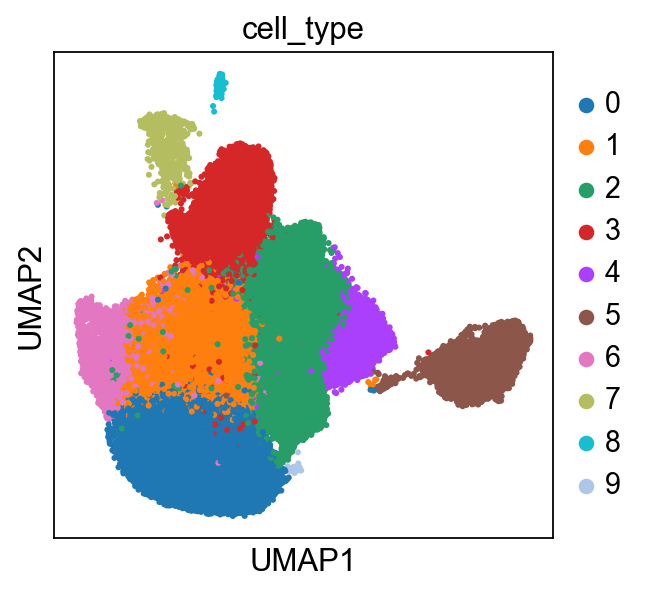

In [36]:
# RBC markers from Roy's data and from https://panglaodb.se/markers

sc.pl.umap(adata, color=['HBAP1','HBA3_3','HBA3_6','HBA1','HBA4','HBA2','HBB2_9',
                         'SLC30A1','ANK1_1','ANK1_2','HBB1','GPX1_1','GPX1_2'], size=30)

celltype = {'0':'0','1':'1','2':'2','3':'3','4':'4','5':'5','6':'6','7':'7','8':'8','9':'9'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### Platelets

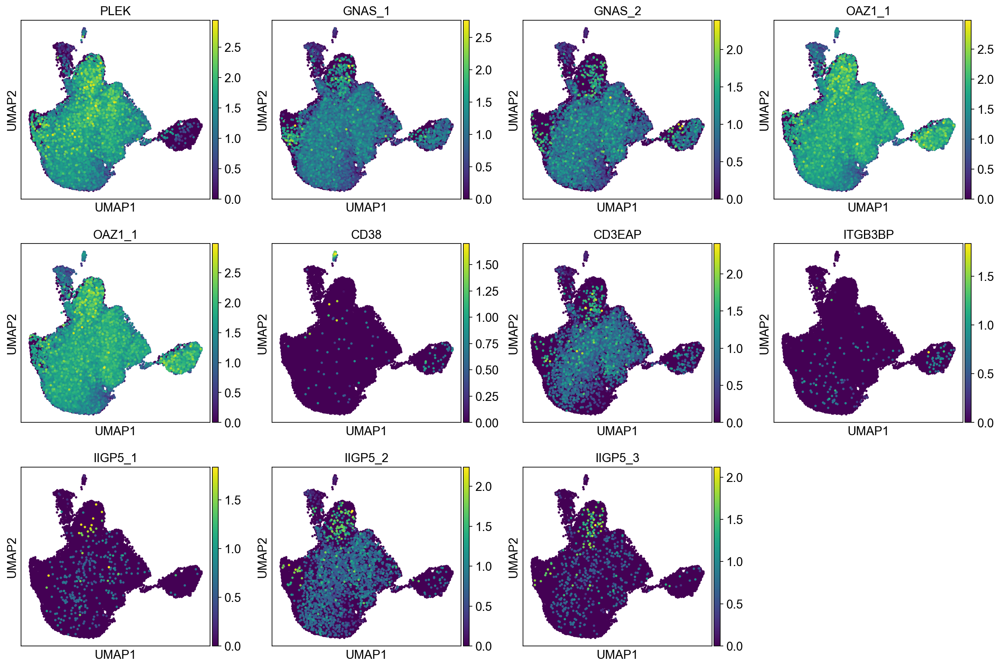

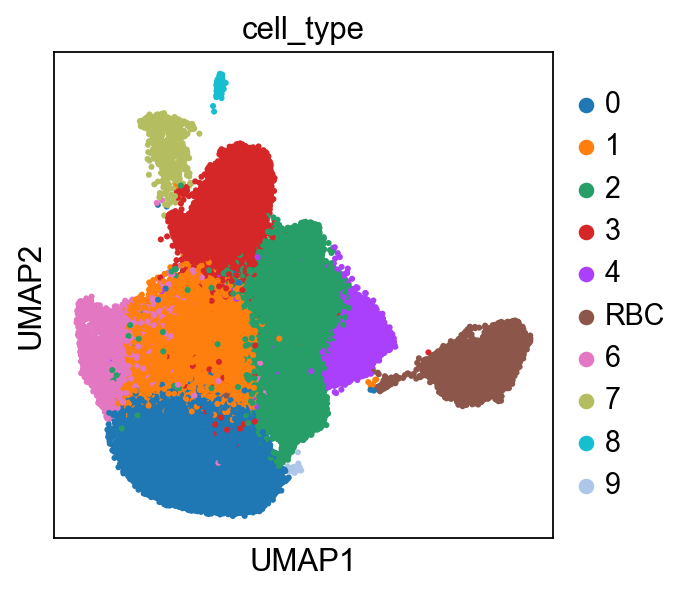

In [37]:
# Platelets markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['PLEK','GNAS_1','GNAS_2','OAZ1_1','OAZ1_1','CD38',
                         'CD3EAP','ITGB3BP','IIGP5_1','IIGP5_2','IIGP5_3'], size=30)

celltype = {'0':'0','1':'1','2':'2','3':'3','4':'4','5':'RBC','6':'6','7':'7','8':'8','9':'9'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### Monocytes

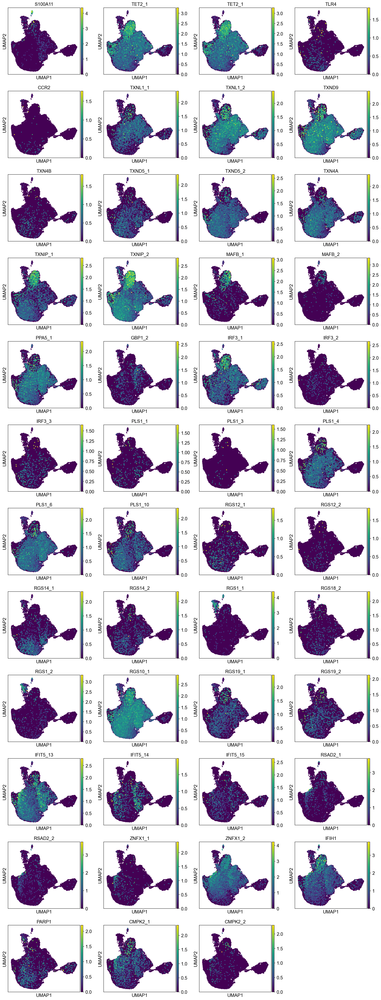

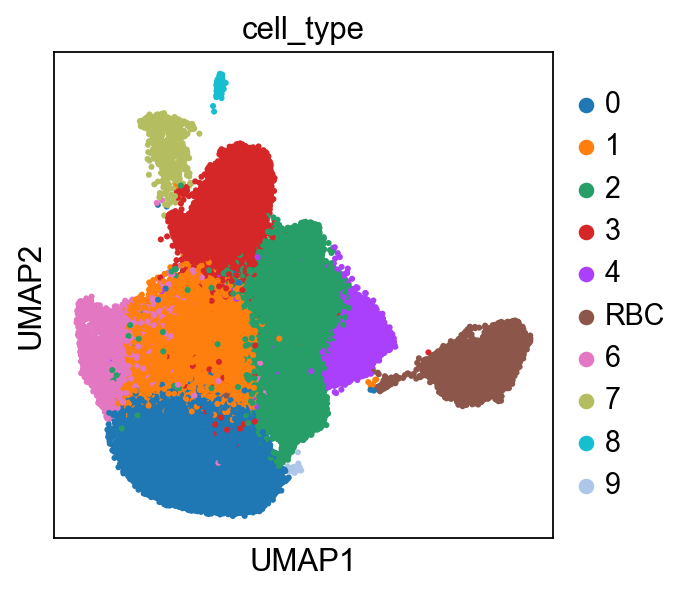

In [39]:
# Monocytes markers from Roy's data and from https://panglaodb.se/markers

sc.pl.umap(adata, color=['S100A11','TET2_1','TET2_1','TLR4','CCR2','TXNL1_1','TXNL1_2','TXND9',
                         'TXN4B','TXND5_1','TXND5_2','TXN4A','TXNIP_1','TXNIP_2','MAFB_1',
                         'MAFB_2','PPA5_1','GBP1_2','IRF3_1','IRF3_2','IRF3_3','PLS1_1','PLS1_3',
                         'PLS1_4','PLS1_6','PLS1_10','RGS12_1','RGS12_2','RGS14_1','RGS14_2',
                         'RGS1_1','RGS18_2','RGS1_2','RGS10_1','RGS19_1','RGS19_2','IFIT5_13',
                         'IFIT5_14','IFIT5_15','RSAD2_1','RSAD2_2','ZNFX1_1','ZNFX1_2','IFIH1',
                         'PARP1','CMPK2_1','CMPK2_2'], size=30)

celltype = {'0':'0','1':'1','2':'2','3':'3','4':'4','5':'RBC','6':'6','7':'7','8':'8','9':'9'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### All clusters

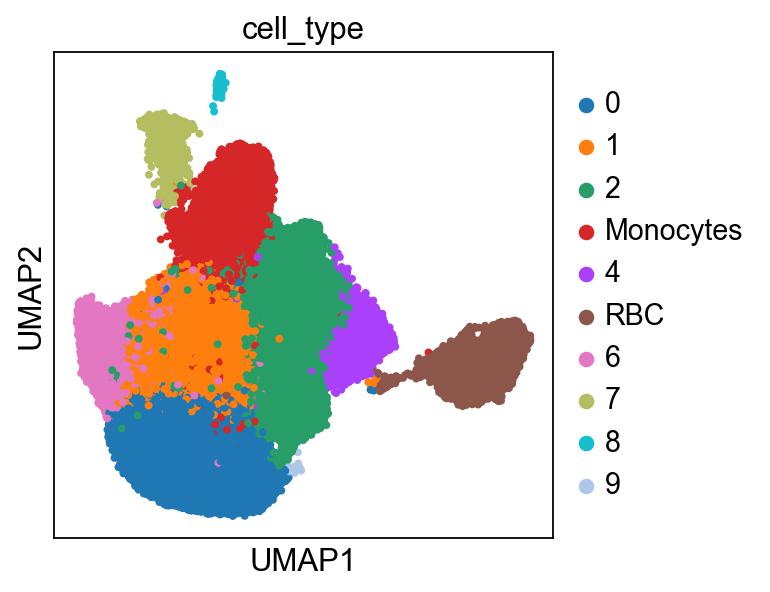

In [40]:
celltype = {'0':'0','1':'1','2':'2','3':'Monocytes','4':'4','5':'RBC','6':'6','7':'7','8':'8','9':'9'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=50)

In [41]:
adata.obs['cell_type'].value_counts()

cell_type
0            15774
1            13623
2            12557
Monocytes     6513
4             2847
RBC           2371
6             2080
7              668
8              109
9               21
Name: count, dtype: int64

In [42]:
adata.obs['cell_type']

Frog2_AAACCCAAGCAGCCCT-1-UNST    Monocytes
Frog2_AAACCCAAGCATAGGC-1-UNST            1
Frog2_AAACCCAAGCCATCCG-1-UNST            0
Frog2_AAACCCAAGCGTATGG-1-UNST    Monocytes
Frog2_AAACCCAAGGCGCTTC-1-UNST            1
                                   ...    
Frog3_TTTGGTTGTAGACAAT-1-PIC             2
Frog3_TTTGGTTGTTTGGGAG-1-PIC             2
Frog3_TTTGGTTTCGCTGTTC-1-PIC             2
Frog3_TTTGGTTTCTGATTCT-1-PIC             2
Frog3_TTTGTTGTCGAAGCAG-1-PIC             2
Name: cell_type, Length: 56563, dtype: category
Categories (10, object): ['0', '1', '2', 'Monocytes', ..., '6', '7', '8', '9']

### Saving adata.obs to csv

In [43]:
adata.obs.to_csv(r'/Code/data/single_cell/animals/frog/new_mapping_11_2024/frog_2_and_3/''frog_2_3_obs.csv')

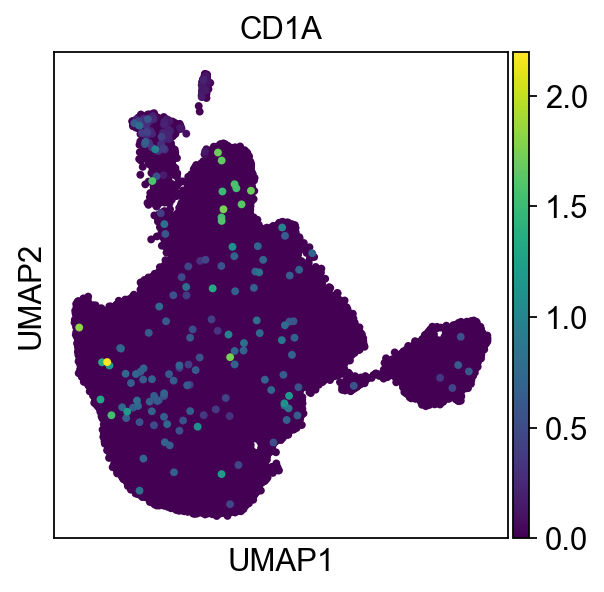

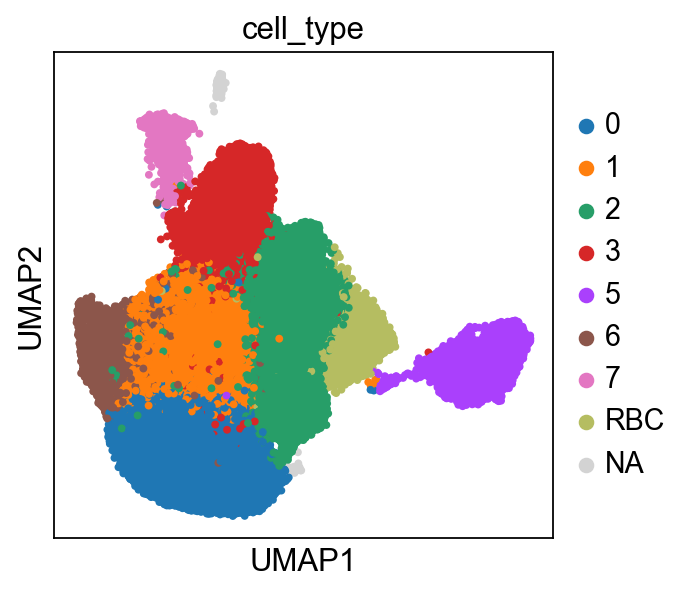

In [23]:
sc.pl.umap(adata, color=['CD1A'], size=50)
sc.pl.umap(adata, color='cell_type', size=50)

### ISG genes 

In [24]:
df_isg_genes = pd.read_csv('/Code/data/single_cell/animals/frog/frog_2/laevis/ISG_genes_frog_2_african.csv', index_col=0)
df_isg_genes = df_isg_genes.sort_index()

df_isg_genes

""
names
AZI2_2
AZI2_3
B2MG_1
B2MG_2
CASP8_1
...
ZCHC2_1
ZCHC2_2
ZCHC2_3


In [25]:
isg_genes_list = df_isg_genes.index.tolist()
isg_genes_list

['AZI2_2',
 'AZI2_3',
 'B2MG_1',
 'B2MG_2',
 'CASP8_1',
 'CASP8_2',
 'CASP8_3',
 'CASP8_4',
 'CCD47_1',
 'CCD47_2',
 'CD274_1',
 'CD274_2',
 'CMPK2_1',
 'CMPK2_2',
 'CMTR1_1',
 'CMTR1_2',
 'CO2',
 'DHX58_1',
 'DHX58_2',
 'DJC13_1',
 'DJC13_2',
 'DNJA1_1',
 'DNJA1_2',
 'DNJA1_3',
 'DNJA1_5',
 'DSRAD_1',
 'DSRAD_2',
 'DTX3L',
 'E2AK2_1',
 'E2AK2_2',
 'EHD4_1',
 'EHD4_2',
 'EMX1_2',
 'EMX1_4',
 'ERAP1_1',
 'ERAP1_2',
 'FA43A_1',
 'FA43A_2',
 'FMR1A',
 'FMR1B_1',
 'FMR1B_2',
 'HERC6_1',
 'HERC6_2',
 'I20L2_2',
 'I20L2_3',
 'IFIH1',
 'IL15RA_1',
 'IL15RA_2',
 'IN35',
 'IRF1_1',
 'IRF1_2',
 'IRF3_1',
 'IRF3_2',
 'IRF3_3',
 'IRF3_4',
 'IRF8_1',
 'IRF8_2',
 'IRF8_3',
 'IRF8_4',
 'LEG1_3',
 'LEG1_4',
 'LEG2_1',
 'LEG3_1',
 'LEG3_2',
 'LEG3_3',
 'LEG4_1',
 'LEG4_2',
 'LEG4_4',
 'LEG8',
 'LEG9B',
 'LEG9_1',
 'LEGLA',
 'LEGLB',
 'MFN2B',
 'MORC3_1',
 'MORC3_2',
 'MORC3_3',
 'MORC3_4',
 'MORC3_5',
 'MOV10_1',
 'MOV10_2',
 'MY88A',
 'MY88B',
 'N4BP1_1',
 'N4BP1_2',
 'N4BP1_3',
 'N4BP1_4',
 'NLRC5',


#### UMAP's of the ISG genes

In [ ]:
# celltype = {'0':'Platelets','1':'T_cells','2':'B_cells','3':'Monocytes','4':'T_cells','5':'RBC','6':'Monocytes'}
# adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color=isg_genes_list, size=50)

#### Dotplot of the ISG genes in expressed in turtle

In [ ]:
sc.pl.dotplot(adata, isg_genes_list, groupby='treatment', standard_scale='var')

## Gene search tools
This function returns a list of genes that are present in adata (markers for example) from an input of a general list.

In [31]:
def find_gene(gene):
    GENES = list(adata.raw.var.index[adata.raw.var.index.str.startswith(gene.upper())])
    return GENES

find_gene('PAX5')

['PAX5_1', 'PAX5_2']

In [ ]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color='TLR4', size=50)
sc.pl.dotplot(adata, 'TLR4', groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color='TLR4', size=50)
sc.pl.dotplot(adata, 'TLR4', groupby='treatment', standard_scale='var')